# LOADING FILES FROM SERVER AND EVALUATE

#### From your WSL terminal (not SCITAS)
cd /path/to/your/local/project

#### Create a directory for the model
mkdir models

#### Download the model checkpoint and training plot
scp -r wan@kuma.hpc.epfl.ch:/home/wan/opp/models/ /mnt/c/Users/Jiasheng/OneDrive/Documents/EPFL/ML\ for\ PREDICTIVE\ MAINTENANCE/Project/MLPM/SERVERFILES

#### Load new files to server
scp "/mnt/c/Users/Jiasheng/OneDrive/Documents/EPFL/ML for PREDICTIVE MAINTENANCE/Project/MLPM/SERVERFILES/train.py" wan@kuma.hpc.epfl.ch:/home/wan/opp/

In [ ]:
import torch
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from train import CNN, SlidingWindowDataset, Trainer
import numpy as np
from torch.utils.data import DataLoader
from dataclasses import dataclass
import pyarrow.parquet as pq
import optuna
import optuna.visualization
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [12]:
dataset_root = Path(r"C:\Users\Jiasheng\OneDrive\Documents\EPFL\ML for PREDICTIVE MAINTENANCE\Project\MLPM\Dataset") # Raw string works without escaping \


@dataclass
class Case():
    info: pd.DataFrame
    measurements: pd.DataFrame


class RawDataset():

    def __init__(self, root, unit = "VG4", load_training=False, load_synthetic=False) -> None:
        
        
        read_pq_file = lambda f: pq.read_table(root / f).to_pandas()
        
        
        cases = {
            "test": [f"{unit}_generator_data_testing_real_measurements.parquet", root / f"{unit}_generator_data_testing_real_info.csv" ], 
        }
        
        if load_training:
            cases = {
                **cases,
                "train": [f"{unit}_generator_data_training_measurements.parquet", root / f"{unit}_generator_data_training_info.csv" ], 
            }
        
        if load_synthetic:
            cases = {
                **cases,
                "test_s01": [f"{unit}_generator_data_testing_synthetic_01_measurements.parquet", root / f"{unit}_generator_data_testing_synthetic_01_info.csv"], 
                "test_s02": [f"{unit}_generator_data_testing_synthetic_02_measurements.parquet", root / f"{unit}_generator_data_testing_synthetic_02_info.csv"]
            }
        
        
        self.data_dict = dict()
        
        for id_c, c in cases.items():
            # if you need to verify the parquet header:
            # pq_rows = RawDataset.read_parquet_schema_df(root / c[0])
            info = pd.read_csv(c[1])
            measurements = read_pq_file(c[0])
            self.data_dict[id_c] = Case(info, measurements)
            
        
        
    @staticmethod
    def read_parquet_schema_df(uri: str) -> pd.DataFrame:
        """Return a Pandas dataframe corresponding to the schema of a local URI of a parquet file.

        The returned dataframe has the columns: column, pa_dtype
        """
        # Ref: https://stackoverflow.com/a/64288036/
        schema = pq.read_schema(uri, memory_map=True)
        schema = pd.DataFrame(({"column": name, "pa_dtype": str(pa_dtype)} for name, pa_dtype in zip(schema.names, schema.types)))
        schema = schema.reindex(columns=["column", "pa_dtype"], fill_value=pd.NA)  # Ensures columns in case the parquet file has an empty dataframe.
        return schema

## Splitting the Dataset and Plotting

In [13]:
# Define Operating Modes
Operating_modes_name = [
    "turbine_mode", "equilibrium_turbine_mode", "pump_mode", "equilibrium_pump_mode",
    "short_circuit_mode", "equilibrium_short_circuit_mode", "machine_on", "machine_off", 
    "dyn_only_on", "all"
]

# Time Series Extraction Functions
def extracting_name_groups_time_series(rds, set_type):
    df_name_control_sensors = rds.data_dict[set_type].info
    control_time_series_name = df_name_control_sensors[
        (df_name_control_sensors['control_signal'] == True) &
        (df_name_control_sensors["signal_type"] == "Measurement")
    ]
    sensors_time_series_name = df_name_control_sensors[
        (df_name_control_sensors['control_signal'] == False) &
        (df_name_control_sensors["signal_type"] == "Measurement")
    ]
    return control_time_series_name["attribute_name"], sensors_time_series_name["attribute_name"]

def extracting_groups_time_series(rds, set_type):
    control_time_series_name, sensors_time_series_name = extracting_name_groups_time_series(rds, set_type=set_type)
    control_df = rds.data_dict[set_type].measurements[control_time_series_name]
    sensors_df = rds.data_dict[set_type].measurements[sensors_time_series_name]
    operating_modes_df = rds.data_dict[set_type].measurements[Operating_modes_name]
    return control_df, sensors_df, operating_modes_df

def get_indexes_operating_mode(operating_modes_df, operating_conditions):
    mask = pd.Series([True] * len(operating_modes_df), index=operating_modes_df.index)
    for column, value in operating_conditions.items():
        mask &= (operating_modes_df[column] == value)
    return operating_modes_df[mask].index

# Helper functions for feature extraction and normalization
def create_scaled_sum_feature(df, feature_prefixes, new_feature_name):
    feature_columns = df.columns[df.columns.str.startswith(tuple(feature_prefixes))]
    df[new_feature_name] = df[feature_columns].sum(axis=1)
    scaler = MinMaxScaler()
    df[new_feature_name] = scaler.fit_transform(df[[new_feature_name]])
    df.drop(columns=feature_columns, inplace=True)
    return df

def normalize_features(df):
    scaler = MinMaxScaler()
    numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
    df[numerical_columns] = scaler.fit_transform(df[numerical_columns])
    return df

def dynamic_group_features(df):
    feature_groups = {
        'voltage_current': df.columns[df.columns.str.startswith(("exc", "ph", "elec", "mid", "neutral"))].tolist(),
        'stator_temperature': df.columns[df.columns.str.startswith("stat_") & 
                                         df.columns.str.contains("coil|magn")].tolist(),
        'cooling_system': df.columns[df.columns.str.startswith("air_circ_")].tolist(),
        'heat_exchanger': df.columns[df.columns.str.startswith("water_circ_")].tolist()
    }

    # Flatten the list of all grouped features
    grouped_features = [feature for group in feature_groups.values() for feature in group]
    # Find complementary features
    complementary_features = [col for col in df.columns if col not in grouped_features]
    
    feature_groups['complementary'] = complementary_features

    return feature_groups

def preprocess_hydraulic_data(rds, set_type, operating_conditions):
    """
    Preprocess the hydraulic site data to return normalized control and sensor signals filtered by operating conditions.

    Parameters:
    - rds: RawDataset object containing the data dictionary
    - set_type: Type of dataset to use ('train', 'test', etc.)
    - feature_group: The group of sensor features to select for preprocessing
    - operating_conditions: A dictionary specifying operating conditions to filter the data
    
    Returns:
    - Dictionary with two normalized and filtered DataFrames: control signals and sensor signals
    """
    # Step 1: Extract control, sensor, and operating mode time series
    control_df, sensors_df, operating_modes_df = extracting_groups_time_series(rds, set_type=set_type)

    # Step 2: Filter based on operating conditions if specified
    if operating_conditions:
        indexes = get_indexes_operating_mode(operating_modes_df, operating_conditions)
        control_df = control_df.loc[indexes]
        sensors_df = sensors_df.loc[indexes]
        
    # Select features containing both 'water' and 'opening' in their name
    water_opening_features = [col for col in control_df.columns if "water" in col and "opening" in col]
    control_df = create_scaled_sum_feature(control_df, water_opening_features, "water_opening_sum")

    # Select features containing both 'injector' and 'opening' in their name
    injector_opening_features = [col for col in control_df.columns if "injector" in col and "opening" in col]
    control_df = create_scaled_sum_feature(control_df, injector_opening_features, "injector_opening_sum")

    # Step 4: Normalize the control and sensor DataFrames
    control_df = normalize_features(control_df)
    sensors_df = normalize_features(sensors_df)

    # Step 5: Select only the sensor features corresponding to the specified feature group
    grouped_data = dynamic_group_features(sensors_df)
    selected_sensor_data = []
    for key in grouped_data.keys():
        selected_sensor_data.append(sensors_df[grouped_data[key]])

    return {
        'control_signals': control_df,
        'sensor_signals': selected_sensor_data
    }

def evaluate_and_visualize(model, control_df_test, sensor_df_test, ground_truth, ground_truth_index):
    model.eval()

    # Create test dataset and loader
    test_dataset = SlidingWindowDataset(
        control_df_test,
        sensor_df_test,
        window=DEFAULT_PARAMS['window']
    )

    # Check dataset dimensions
    print("\nDataset dimensions:")
    X, y = test_dataset[0]  # Get first item
    print(f"Single input (X) shape: {X.shape}")
    print(f"Single target (y) shape: {y.shape}")
    print(f"Expected input channels: {DEFAULT_PARAMS['in_channels']}")
    print(f"Expected output channels: {DEFAULT_PARAMS['out_channels']}")


    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
    
    predictions = []
    actuals = []
    with torch.no_grad():
        for X, y in test_loader:
            X = X.to(device)
            pred = model(X)
            predictions.append(pred.cpu().numpy())
            actuals.append(y.numpy())
    
    y_pred = np.concatenate(predictions, axis=0)
    y_test = np.concatenate(actuals, axis=0)

    # Get the time index
    time_index = sensor_df_test.index[:len(y_test)]
    sensor_names = sensor_df_test.columns

    n_sensors = y_test.shape[1]
    for sensor_idx in range(n_sensors):
        # Get the specific sensor name
        sensor_name = sensor_names[sensor_idx]
        
        # Create figure with 3 subplots
        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 12), height_ratios=[2, 1, 1])
        fig.suptitle(f'Sensor: {sensor_name}', y=1.02)
        
        # Rest of the plotting code remains the same
        ax1.plot(time_index, y_test[:, sensor_idx], label='Actual', alpha=0.7)
        ax1.plot(time_index, y_pred[:, sensor_idx], label='Predicted', alpha=0.7)
        ax1.set_title(f'Predictions and Actual Values')
        ax1.set_xlabel('Time')
        ax1.set_ylabel('Value')
        ax1.legend()
        ax1.grid(True)
        
        # Plot 2: Ground Truth
        ax2.plot(ground_truth_index, ground_truth, 'r-')
        ax2.set_ylim(-0.1, 1.1)
        ax2.set_title('Ground Truth Anomalies')
        ax2.set_xlabel('Time')
        ax2.set_ylabel('Anomaly Present')
        ax2.grid(True)
        
        # Plot 3: Difference between predicted and actual
        difference = y_pred[:, sensor_idx] - y_test[:, sensor_idx]
        ax3.plot(time_index, difference, 'g-', label='Prediction Error')
        ax3.axhline(y=0, color='r', linestyle='--', alpha=0.3)
        ax3.set_title('Prediction Error (Predicted - Actual)')
        ax3.set_xlabel('Time')
        ax3.set_ylabel('Error')
        ax3.grid(True)
        ax3.legend()
        
        # Calculate metrics for this sensor
        mse = mean_squared_error(y_test[:, sensor_idx], y_pred[:, sensor_idx])
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test[:, sensor_idx], y_pred[:, sensor_idx])
        
        # Add metrics to plot
        textstr = f'Sensor: {sensor_name}\nRMSE: {rmse:.4f}\nMAE: {mae:.4f}'
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        ax1.text(0.02, 0.98, textstr, transform=ax1.transAxes, fontsize=9,
                verticalalignment='top', bbox=props)
        
        plt.tight_layout()
        plt.show()
    
    # Print overall metrics
    print("\nOverall Metrics:")
    print(f"Overall RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")
    print(f"Overall MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    
    return y_pred, y_test

def obtain_ground_truth(dataset_root, unit="VG5", test_set="01", anomaly_type="a"):

    # Load anomaly data
    anomaly_file = Path(dataset_root) / "synthetic_anomalies" / f"{unit}_anomaly_{test_set}_type_{anomaly_type}.parquet"
    anomaly_data = pq.read_table(anomaly_file).to_pandas()
    ground_truth = anomaly_data['ground_truth']
    ground_truth_index = anomaly_data.index
    
    return ground_truth, ground_truth_index

def plot_ground_truth(ground_truth, ground_truth_index, unit, test_set, anomaly_type):
    """Plot ground truth data"""
    plt.figure(figsize=(15, 4))
    plt.plot(ground_truth_index, ground_truth, 'b-', linewidth=1)
    
    plt.title(f'Ground Truth - {unit}, Set {test_set}, Type {anomaly_type}')
    plt.ylim(-0.1, 1.1)
    plt.grid(True)
    plt.xlabel('Time')
    plt.ylabel('Anomaly Present')
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()


# Set Params [Ensure same as Training]

In [14]:
# Set paths
base_path = Path("C:/Users/Jiasheng/OneDrive/Documents/EPFL/ML for PREDICTIVE MAINTENANCE/Project/MLPM/SERVERFILES")
dataset_path = Path("C:/Users/Jiasheng/OneDrive/Documents/EPFL/ML for PREDICTIVE MAINTENANCE/Project/MLPM/Dataset")
model_path = base_path / "models/model_checkpoint.pth"

# Load Model Checkpoint
checkpoint = torch.load(model_path, map_location=torch.device('cpu'))
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

operating_conditions_set = {
    "dyn_only_on": False, "turbine_mode": True, "equilibrium_turbine_mode": True, "short_circuit_mode": False
}

# LOAD PARAMETERS
SYNTHETIC_PARAMS = {
    'unit': 'VG5',
    'test_set': '01',
    'anomaly_type': 'a',
    'set_type':'test_s01'
}

# Extract channels from the checkpoint
total_input_channels = checkpoint['total_input_channels']
total_output_channels = checkpoint['total_output_channels']

DEFAULT_PARAMS = {
    'window': 50,
    'n_ch': 64,
    'n_k': 7,
    'n_hidden': 128,
    'n_layers': 4,
    'dropout': 0.2,
    'padding': 'same',
    'use_batchnorm': True,
    'batch_size': 256,
    'base_lr': 5e-4,
    'weight_decay': 1e-5,
    'max_epochs': 30,
    'in_channels': total_input_channels,  # Update with actual value
    'out_channels': total_output_channels  # Update with actual value
}

C:\Users\Jiasheng\AppData\Local\Temp\ipykernel_4808\2147731366.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=torch.dev

## Train/Val Losses

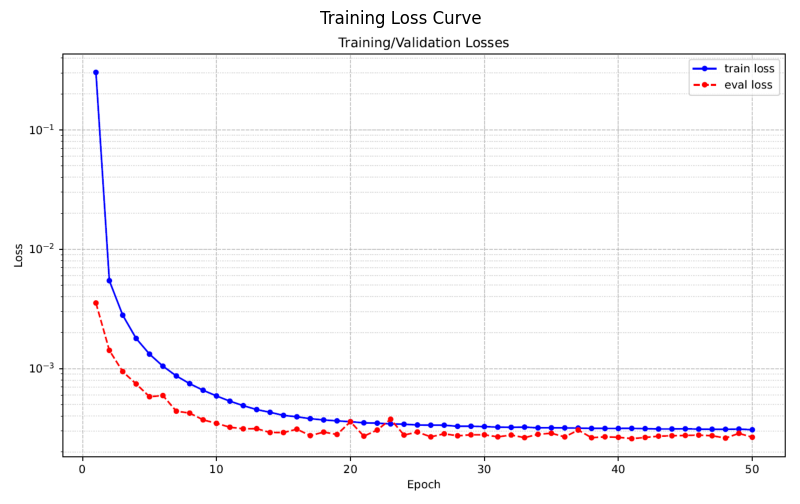

In [36]:
# Path to your image
image_path = "models/training_loss.png"  # Adjust path based on where your file is located

# Load and display the image
img = mpimg.imread(image_path)
plt.figure(figsize=(15, 6))  # Optional: Adjust the figure size
plt.imshow(img)
plt.axis('off')  # Hide axes for a cleaner look
plt.title("Training Loss Curve")  # Optional: Add a title
plt.show()


In [37]:
# Load only synthetic test data (no training data needed)
rds_u5_synth = RawDataset(dataset_root, "VG5", load_synthetic=True, load_training=False)

# Process synthetic datasets
rds_u5_synth_processed = preprocess_hydraulic_data(
    rds_u5_synth, set_type=SYNTHETIC_PARAMS['set_type'], operating_conditions=operating_conditions_set  # set at the top
)

control_df_test = rds_u5_synth_processed['control_signals']
sensors_df_test = rds_u5_synth_processed['sensor_signals']

sensors_voltage_current_test = sensors_df_test[0]
sensors_stator_temperature_test = sensors_df_test[1]
sensors_cooling_system_test = sensors_df_test[2]
sensors_heat_exchanger_test = sensors_df_test[3]
sensors_other_test = sensors_df_test[4]

# Print the number of features in each sensor group
print("\nNumber of features in each sensor group:")
for i, sensor_group in enumerate(['Voltage/Current', 'Stator Temperature', 
                                'Cooling System', 'Heat Exchanger', 'Other']):
    print(f"{sensor_group}: {len(sensors_df_test[i].columns)} features")

# Now you can safely delete if needed
del rds_u5_synth
del rds_u5_synth_processed


Number of features in each sensor group:
Voltage/Current: 14 features
Stator Temperature: 30 features
Cooling System: 12 features
Heat Exchanger: 9 features
Other: 10 features


## Plotting Ground Truth

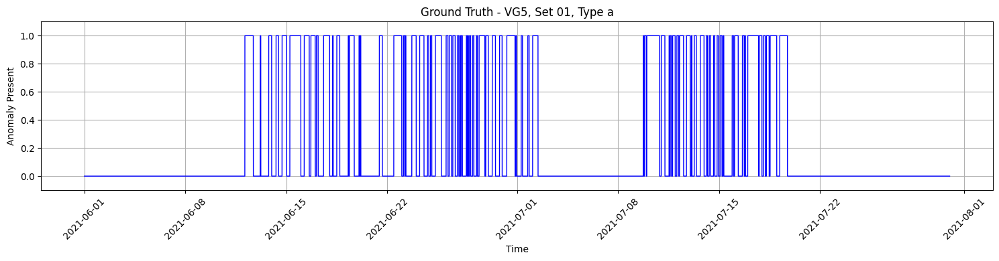

In [38]:
ground_truth, ground_truth_index = obtain_ground_truth(
    dataset_root,
    unit=SYNTHETIC_PARAMS['unit'],
    test_set=SYNTHETIC_PARAMS['test_set'],
    anomaly_type=SYNTHETIC_PARAMS['anomaly_type']
)

plot_ground_truth(
        ground_truth,
        ground_truth_index,
        unit=SYNTHETIC_PARAMS['unit'],
        test_set=SYNTHETIC_PARAMS['test_set'],
        anomaly_type=SYNTHETIC_PARAMS['anomaly_type']
    )

In [40]:
SENSOR_GROUPS_TEST = {
    'voltage_current': sensors_df_test[0],
    'stator_temperature': sensors_df_test[1],
    'cooling_system': sensors_df_test[2],
    'heat_exchanger': sensors_df_test[3],
    'other': sensors_df_test[4]
}

# Select sensor groups to evaluate
SELECTED_SENSOR_GROUPS_TEST = ['stator_temperature', 'cooling_system', 'heat_exchanger']

# Combine selected sensors
combined_test_sensors = pd.concat(
    [SENSOR_GROUPS_TEST[group] for group in SELECTED_SENSOR_GROUPS_TEST], axis=1
)


Dataset dimensions:
Single input (X) shape: torch.Size([60, 50])
Single target (y) shape: torch.Size([51])
Expected input channels: 60
Expected output channels: 51


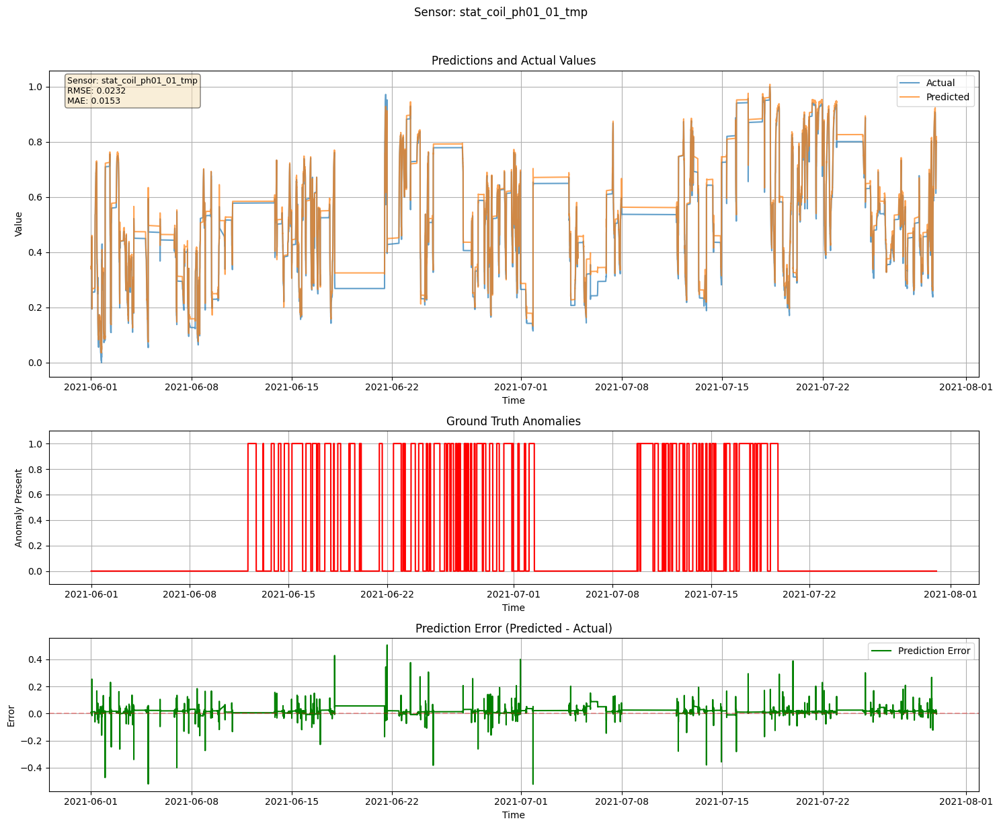

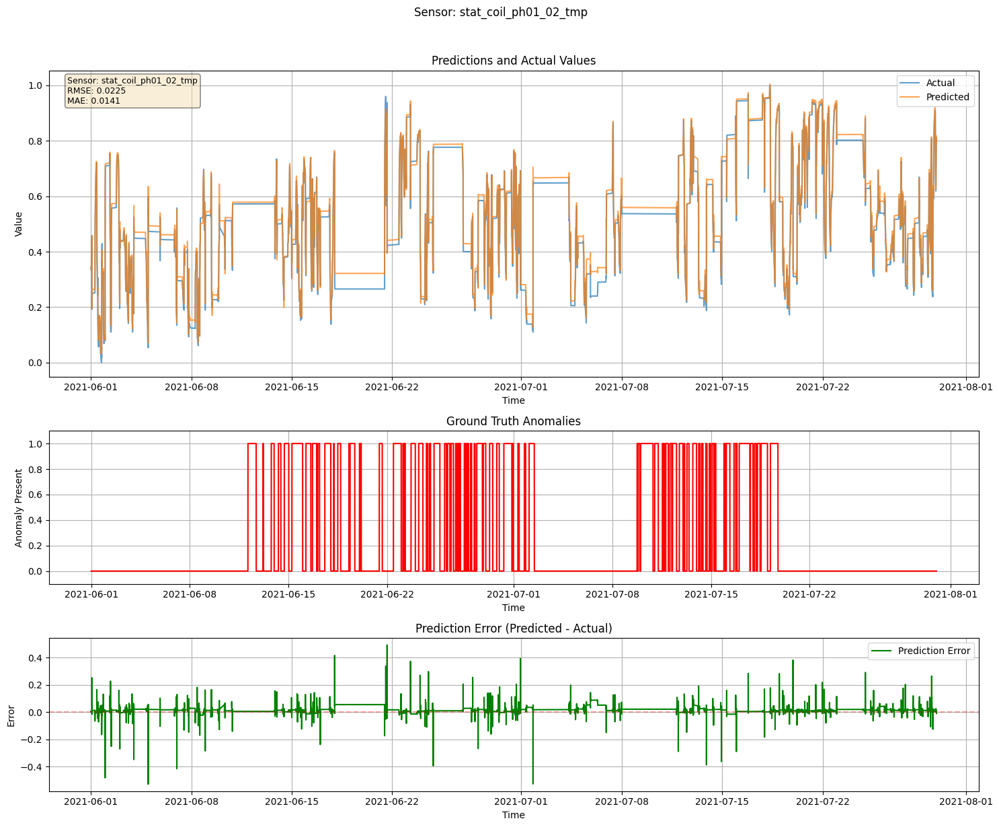

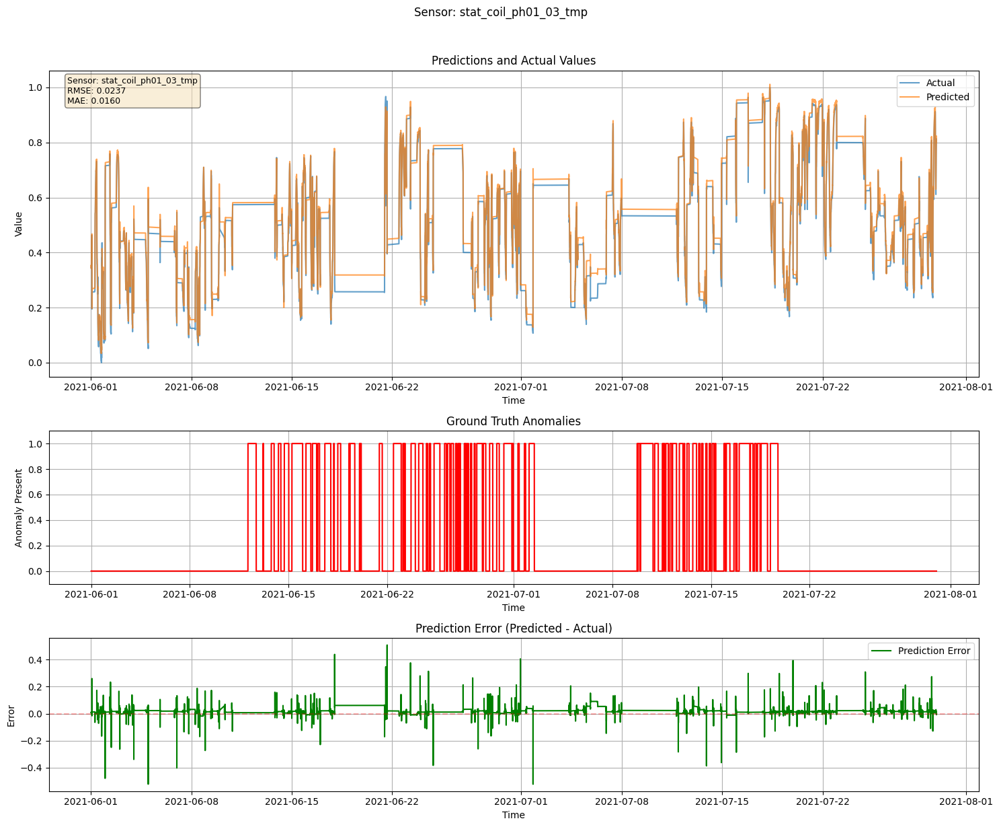

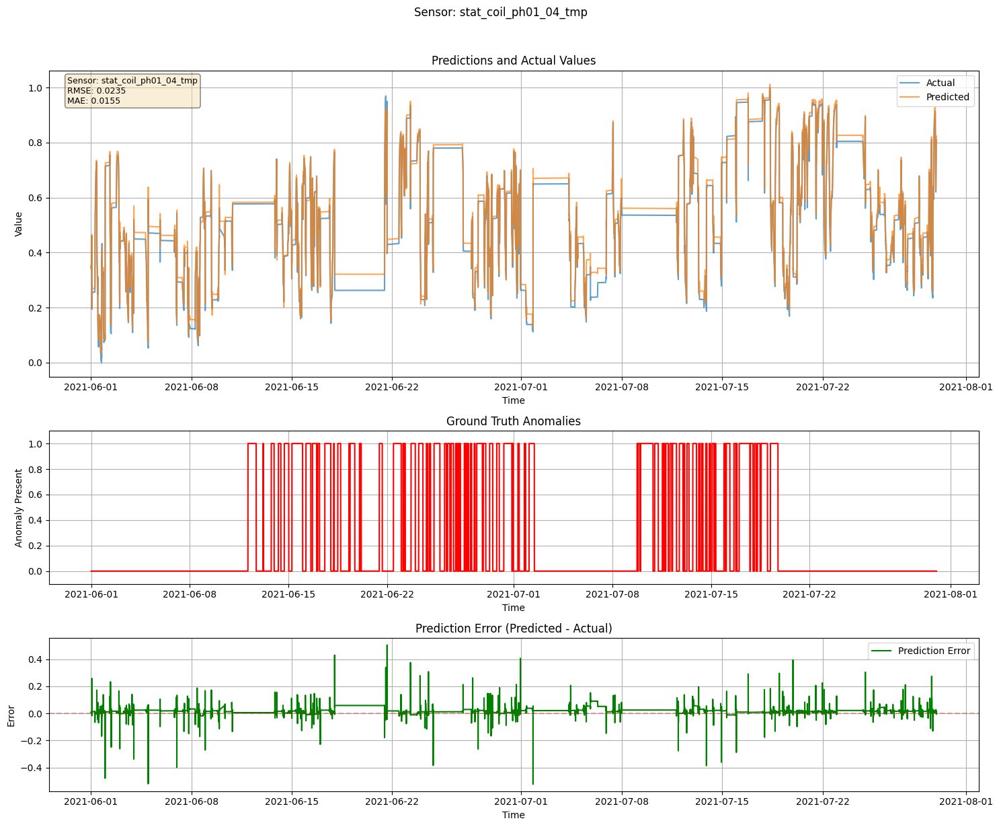

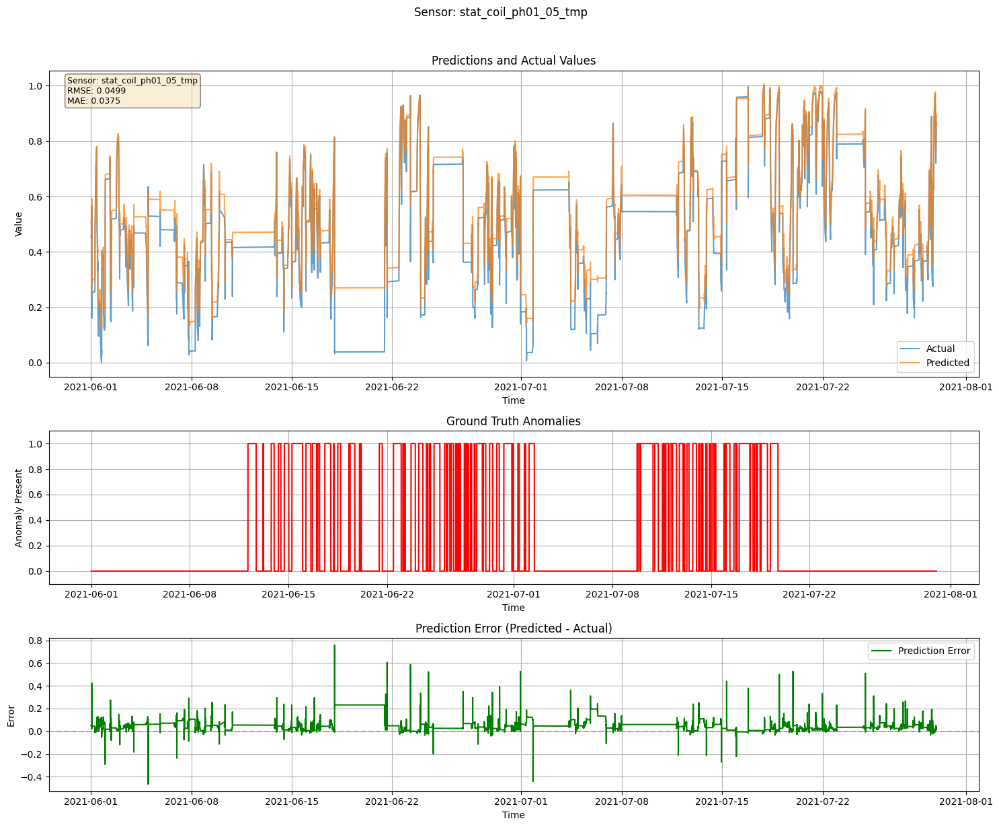

...

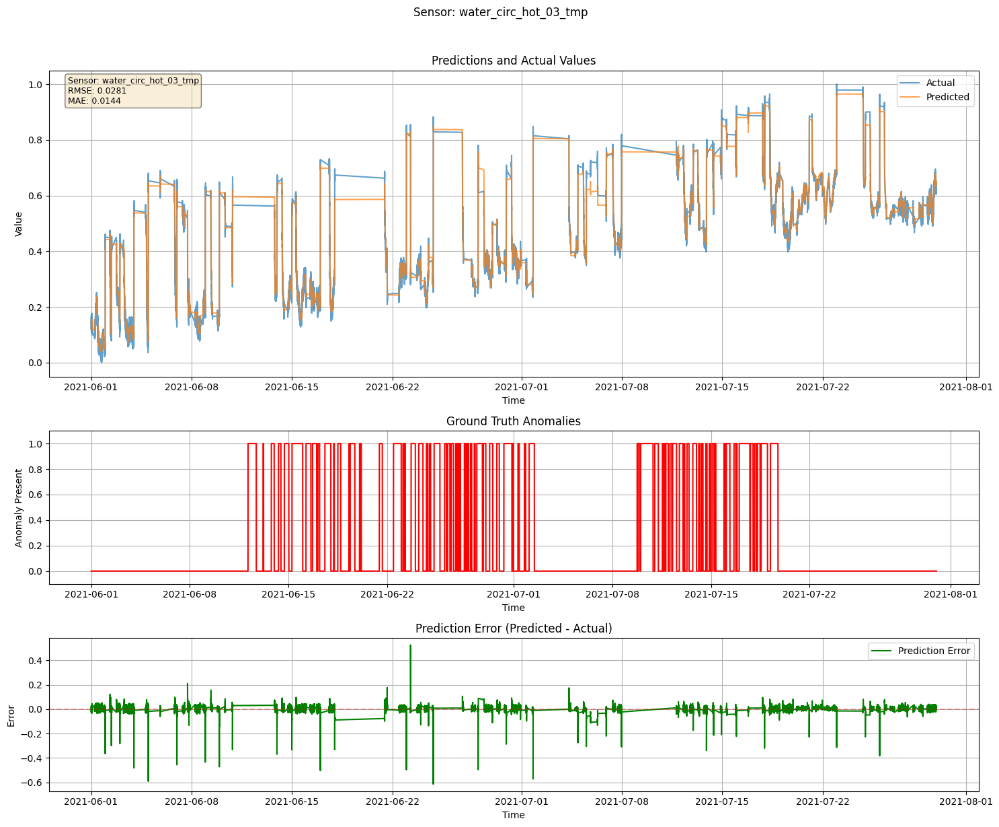

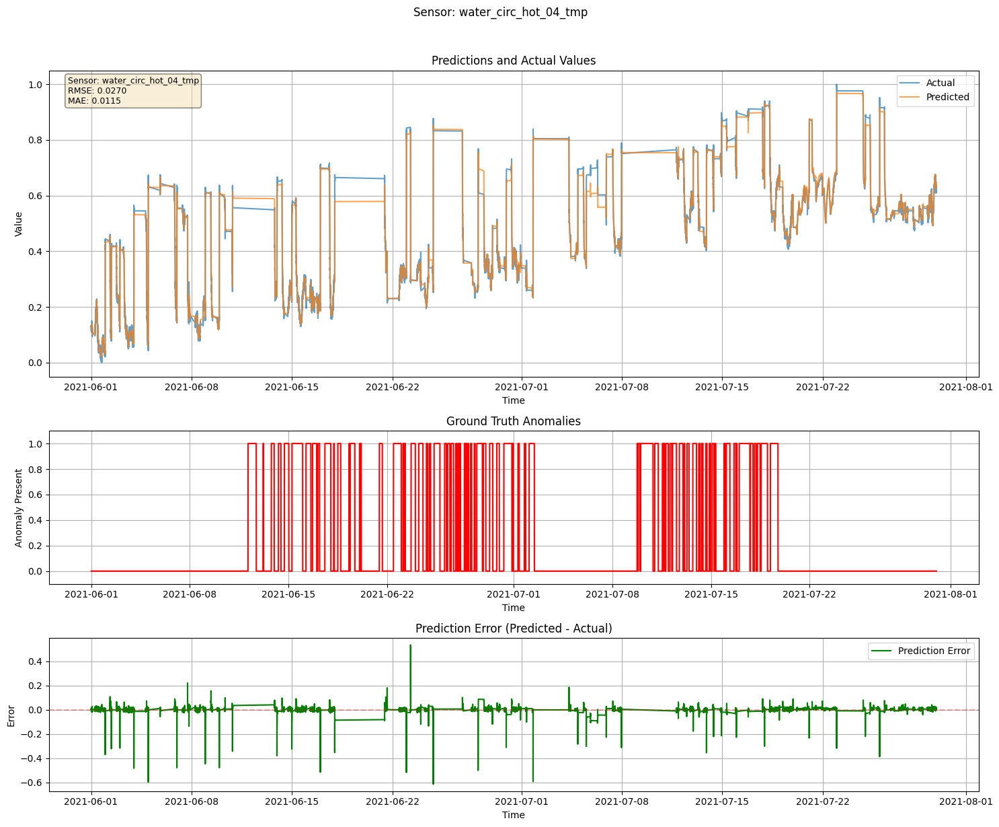

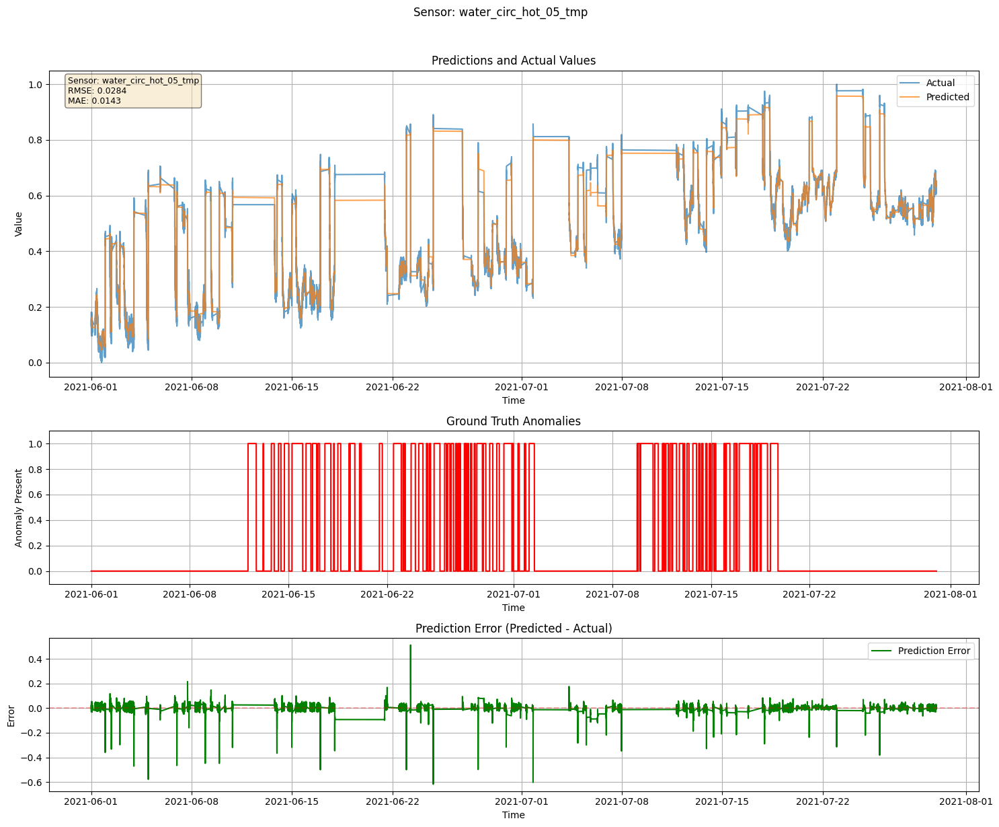

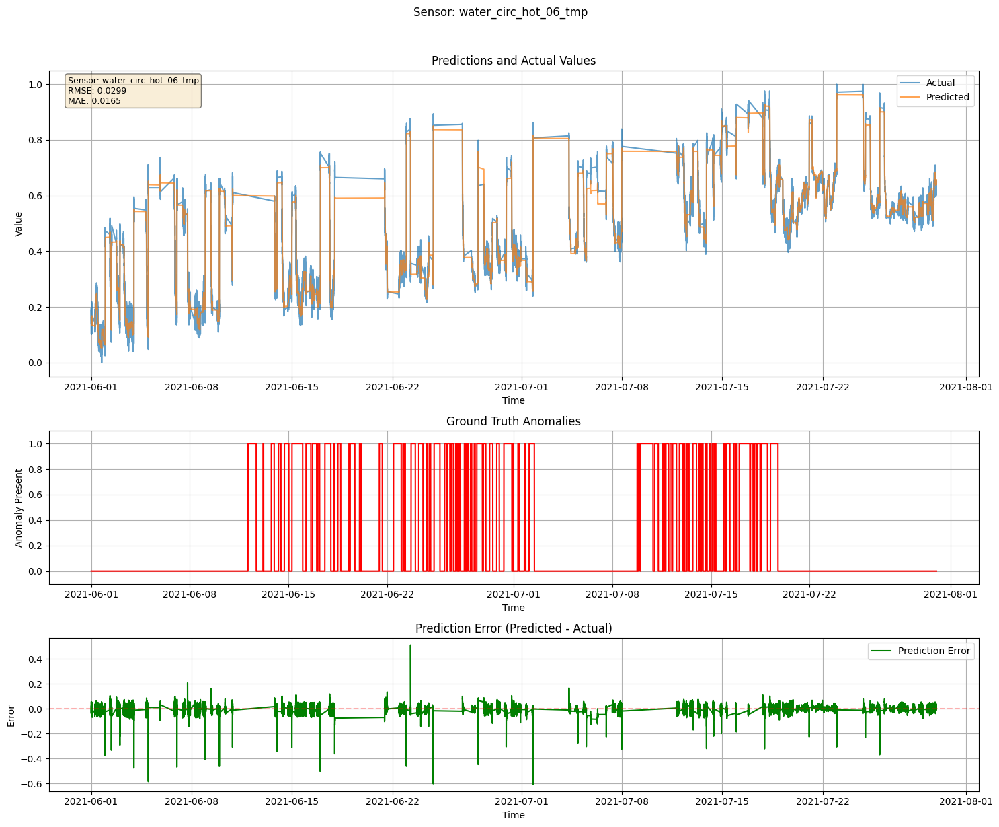

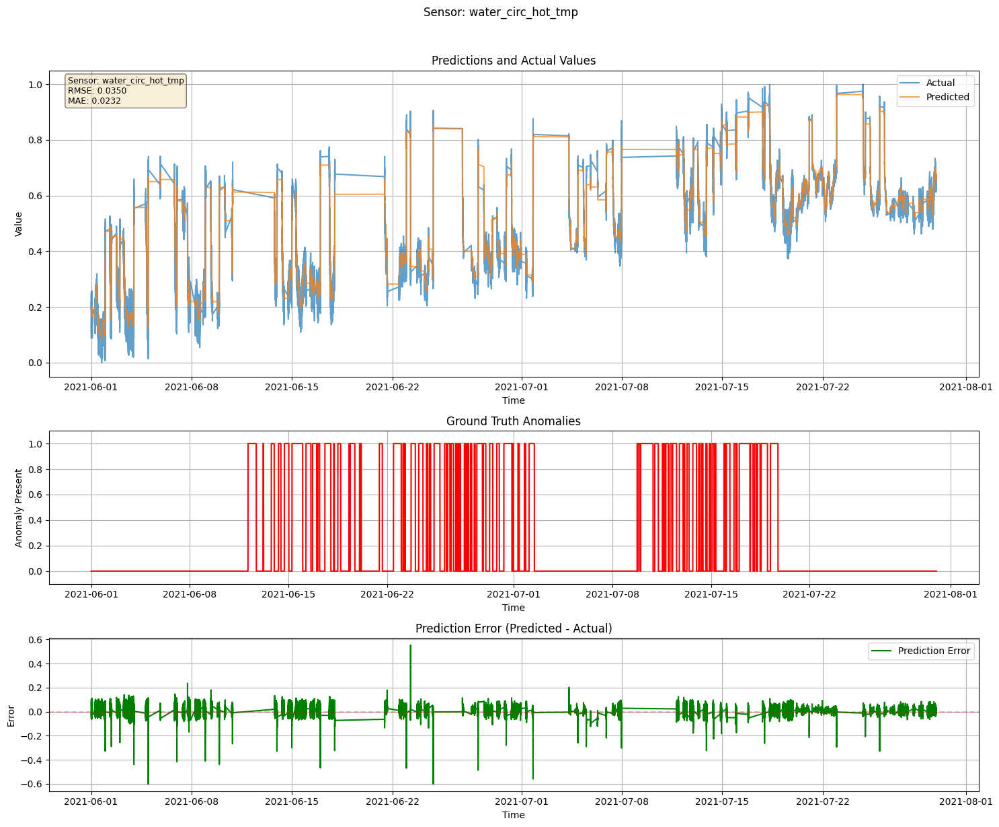


Overall Metrics:
Overall RMSE: 0.0317
Overall MAE: 0.0176


In [41]:
# Load Model Parameters
model_params = checkpoint['params']
total_input_channels = checkpoint['total_input_channels']
total_output_channels = checkpoint['total_output_channels']

model = CNN(
    in_channels=model_params['in_channels'],
    out_channels=model_params['out_channels'],
    window=model_params['window'],
    n_ch=model_params['n_ch'],
    n_k=model_params['n_k'],
    n_hidden=model_params['n_hidden'],
    n_layers=model_params['n_layers'],
    dropout=model_params['dropout'],
    padding=model_params['padding'],
    use_batchnorm=model_params['use_batchnorm']
)

model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

# Load Ground Truth
ground_truth, ground_truth_index = obtain_ground_truth(
    dataset_root=dataset_path,
    unit="VG5",
    test_set="01",
    anomaly_type="a"
)

# Evaluate Model
y_pred, y_test = evaluate_and_visualize(
    model,
    control_df_test,
    combined_test_sensors,
    ground_truth,
    ground_truth_index
)

# OPTUNA STUDY

---

### Rendered Markdown
When rendered, it will look like this:

To copy the `optuna` and `optuna_results` directories, you can use the following commands:

```bash
scp -r wan@scitas.epfl.ch:opp/optuna ./
scp -r wan@scitas.epfl.ch:opp/optuna_results ./

###  Uploading a file

# In WSL, navigate to where your hyperparam_tuning.py is located
cd /mnt/c/Users/Jiasheng/OneDrive/Documents/EPFL/ML\ for\ PREDICTIVE\ MAINTENANCE/Project/MLPM/SERVERFILES

# Upload to SCITAS
scp hyperparam_tuning.py wan@scitas.epfl.ch:opp/

In [36]:
# Load the study with the correct database file
study = optuna.load_study(
    storage=f'sqlite:///optuna_results/study_20241201_111112.db',
    study_name='cnn_hyperopt_20241201_111112'  # or the study name might include the timestamp
)

# Print study information
print(f"\nNumber of trials: {len(study.trials)}")
print(f"Best value achieved: {study.best_value}")
print("\nBest parameters:")
for key, value in study.best_trial.params.items():
    print(f"{key}: {value}")


Number of trials: 10
Best value achieved: 0.0002610013179946691

Best parameters:
n_layers: 3
n_ch: 34
n_k: 9
n_hidden: 268
activation: relu
dropout: 0.006860848750797066
use_batchnorm: False
base_lr: 2.6086046890402925e-05
weight_decay: 8.394477725987022e-05


In [35]:
# Visualizations
fig = optuna.visualization.plot_param_importances(study)
fig.show()

In [37]:
fig = optuna.visualization.plot_contour(study, params=['base_lr', 'n_layers'])
fig.show()

In [40]:
fig = optuna.visualization.plot_contour(study, params=['n_hidden', 'n_layers'])
fig.show()

In [38]:
# Load results into DataFrame
hyper_df = study.trials_dataframe()
display(hyper_df)

,number,value,datetime_start,datetime_complete,duration,params_activation,params_base_lr,params_dropout,params_n_ch,params_n_hidden,params_n_k,params_n_layers,params_use_batchnorm,params_weight_decay,state
0,0,0.001290,2024-12-01 11:11:13.069097,2024-12-01 12:00:08.974889,0 days 00:48:55.905792,relu,0.000213,0.137849,75,79,5,5,False,0.000001,COMPLETE
1,1,0.000925,2024-12-01 12:00:08.995585,2024-12-01 13:16:54.580169,0 days 01:16:45.584584,leaky_relu,0.000023,0.071957,38,80,5,5,False,0.000002,COMPLETE
2,2,0.000261,2024-12-01 13:16:54.599148,2024-12-01 14:19:51.866436,0 days 01:02:57.267288,relu,0.000026,0.006861,34,268,9,3,False,0.000084,COMPLETE
3,3,0.001283,2024-12-01 14:19:51.886138,2024-12-01 15:07:43.931082,0 days 00:47:52.044944,leaky_relu,0.000014,0.210386,60,207,7,5,False,0.000002,COMPLETE
4,4,0.005409,2024-12-01 15:07:43.947612,2024-12-01 15:54:30.142941,0 days 00:46:46.195329,relu,0.000458,0.348953,86,111,9,3,False,0.000001,COMPLETE
5,5,0.027107,2024-12-01 15:54:30.161655,2024-12-01 16:43:43.696511,0 days 00:49:13.534856,leaky_relu,0.004271,0.327912,79,65,9,5,True,0.000686,COMPLETE
6,6,0.043565,2024-12-01 16:43:43.713767,2024-12-01 17:31:58.573875,0 days 00:48:14.860108,relu,0.000015,0.336235,57,345,7,6,False,0.000004,COMPLETE
7,7,0.000474,2024-12-01 17:31:58.606961,2024-12-01 18:16:19.285063,0 days 00:44:20.678102,relu,0.000014,0.163792,47,65,5,2,False,0.000049,COMPLETE
8,8,0.000399,2024-12-01 18:16:19.303124,2024-12-01 19:03:37.735585,0 days 00:47:18.432461,leaky_relu,0.000033,0.191441,93,130,9,5,False,0.000048,COMPLETE
9,9,0.000332,2024-12-01 19:03:37.752548,2024-12-01 19:48:07.853787,0 days 00:44:30.101239,leaky_relu,0.000025,0.333071,122,144,9,2,False,0.000053,COMPLETE
